In [0]:
#importing MLflow and enabling autolog machine runs
import mlflow
mlflow.pyspark.ml.autolog()

In [0]:
#reading the csv file
FaultDF =spark.read.csv('/FileStore/tables/FaultDataset.csv', header ='true', inferSchema='true')

DATA EXPLORATION AND PREPROCESSING

In [0]:
#displaying the dataset
FaultDF.display()

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,fault_detected
0.3503125,0.3496875,0.35,0.3459375,0.3475,0.3459375,0.341875,0.3434375,0.355,0.3553125,0.3459375,0.3525,0.3575,0.3590625,0.35875,0.3484375,0.3590625,0.35,0.3559375,0.3490625,0
0.5090625,0.484375,0.046875,0.071875,0.06,0.0634375,0.0575,0.0546875,0.0559375,0.058125,0.0628125,0.065625,0.0640625,0.0634375,0.0534375,0.084375,0.0615625,0.05375,0.076875,0.056875,0
0.0928125,0.0975,0.1096875,0.1025,0.09625,0.1053125,0.09875,0.098125,0.091875,0.0909375,0.09875,0.103125,0.1,0.1034375,0.1015625,0.0978125,0.0990625,0.10375,0.098125,0.1040625,0
0.09375,0.089375,0.091875,0.0996875,0.0909375,0.096875,0.0940625,0.096875,0.096875,0.099375,0.099375,0.0959375,0.0959375,0.0940625,0.09125,0.0996875,0.09375,0.0934375,0.0971875,0.094375,0
0.036875,0.0440625,0.038125,0.0428125,0.0353125,0.0340625,0.033125,0.0403125,0.0346875,0.036875,0.035625,0.03625,0.0409375,0.039375,0.035,0.040625,0.0384375,0.036875,0.04,0.0371875,0
0.135625,0.3034375,0.13875,0.140625,0.126875,0.130625,0.139375,0.143125,0.1290625,0.140625,0.1340625,0.1396875,0.1384375,0.1453125,0.1453125,0.1496875,0.1440625,0.1359375,0.1453125,0.14625,0
0.3446875,0.35125,0.3353125,0.3471875,0.34625,0.348125,0.3478125,0.3521875,0.3525,0.35125,0.3571875,0.360625,0.3640625,0.36625,0.3640625,0.3634375,0.3475,0.35375,0.1575,0.351875,0
0.036875,0.035625,0.03125,0.0375,0.0390625,0.034375,0.0315625,0.031875,0.0378125,0.0321875,0.0371875,0.038125,0.035,0.0353125,0.0325,0.03,0.0325,0.0321875,0.0321875,0.03125,0
0.0371875,0.039375,0.033125,0.04,0.04125,0.03875,0.035625,0.0384375,0.0378125,0.0365625,0.033125,0.0365625,0.03375,0.034375,0.0346875,0.04125,0.0365625,0.035,0.034375,0.0396875,0
0.3590625,0.3609375,0.360625,0.3590625,0.355,0.365,0.355625,0.358125,0.3575,0.3578125,0.355625,0.3584375,0.3521875,0.3459375,0.3521875,0.3509375,0.3525,0.35625,0.353125,0.3540625,0


In [0]:
#Renaming the headings by giving them names as R1 to R20 to represent the different readings
FaultDF = FaultDF.toDF("R1", "R2", "R3", "R4","R5","R6", "R7", "R8", "R9","R10","R11", "R12", "R13", "R14","R15","R16", "R17", "R18", "R19","R20","fault_detected")

In [0]:
FaultDF.display()

R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12,R13,R14,R15,R16,R17,R18,R19,R20,fault_detected
0.3503125,0.3496875,0.35,0.3459375,0.3475,0.3459375,0.341875,0.3434375,0.355,0.3553125,0.3459375,0.3525,0.3575,0.3590625,0.35875,0.3484375,0.3590625,0.35,0.3559375,0.3490625,0
0.5090625,0.484375,0.046875,0.071875,0.06,0.0634375,0.0575,0.0546875,0.0559375,0.058125,0.0628125,0.065625,0.0640625,0.0634375,0.0534375,0.084375,0.0615625,0.05375,0.076875,0.056875,0
0.0928125,0.0975,0.1096875,0.1025,0.09625,0.1053125,0.09875,0.098125,0.091875,0.0909375,0.09875,0.103125,0.1,0.1034375,0.1015625,0.0978125,0.0990625,0.10375,0.098125,0.1040625,0
0.09375,0.089375,0.091875,0.0996875,0.0909375,0.096875,0.0940625,0.096875,0.096875,0.099375,0.099375,0.0959375,0.0959375,0.0940625,0.09125,0.0996875,0.09375,0.0934375,0.0971875,0.094375,0
0.036875,0.0440625,0.038125,0.0428125,0.0353125,0.0340625,0.033125,0.0403125,0.0346875,0.036875,0.035625,0.03625,0.0409375,0.039375,0.035,0.040625,0.0384375,0.036875,0.04,0.0371875,0
0.135625,0.3034375,0.13875,0.140625,0.126875,0.130625,0.139375,0.143125,0.1290625,0.140625,0.1340625,0.1396875,0.1384375,0.1453125,0.1453125,0.1496875,0.1440625,0.1359375,0.1453125,0.14625,0
0.3446875,0.35125,0.3353125,0.3471875,0.34625,0.348125,0.3478125,0.3521875,0.3525,0.35125,0.3571875,0.360625,0.3640625,0.36625,0.3640625,0.3634375,0.3475,0.35375,0.1575,0.351875,0
0.036875,0.035625,0.03125,0.0375,0.0390625,0.034375,0.0315625,0.031875,0.0378125,0.0321875,0.0371875,0.038125,0.035,0.0353125,0.0325,0.03,0.0325,0.0321875,0.0321875,0.03125,0
0.0371875,0.039375,0.033125,0.04,0.04125,0.03875,0.035625,0.0384375,0.0378125,0.0365625,0.033125,0.0365625,0.03375,0.034375,0.0346875,0.04125,0.0365625,0.035,0.034375,0.0396875,0
0.3590625,0.3609375,0.360625,0.3590625,0.355,0.365,0.355625,0.358125,0.3575,0.3578125,0.355625,0.3584375,0.3521875,0.3459375,0.3521875,0.3509375,0.3525,0.35625,0.353125,0.3540625,0


In [0]:
#Changing the data to a table view
FaultDF.createOrReplaceTempView('FaultData')

In [0]:
%sql
----Checking for the average of each column


select fault_detected, AVG(R1) as R1,AVG(R2) as R2,AVG(R3) as R3,AVG(R4) as R4,AVG(R5) as R5,AVG(R6) as R6,AVG(R7) as R7,AVG(R8) as R8,AVG(R9) as R9,AVG(R10) as R10,AVG(R11) as R11,AVG(R12) as R12,AVG(R13) as R13,AVG(R14) as R14,AVG(R15) as R15,AVG(R16) as R16,AVG(R17) as R17,AVG(R18) as R18,AVG(R19) as R19,AVG(R20) as R20
from FaultData
group by fault_detected

fault_detected,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12,R13,R14,R15,R16,R17,R18,R19,R20
1,0.5345139636246223,0.5351908227507541,0.5354065997632375,0.5359103933491173,0.5363514986009466,0.5362730036590614,0.5369834938656909,0.5378515120533786,0.5384589566293595,0.5390929697589341,0.539499973095136,0.5398922460180796,0.5410531909169192,0.5418817934782603,0.5424007210503661,0.5432684029272485,0.544029339754627,0.5447457490314256,0.5455314383340506,0.5465267165303486
0,0.14873264636246228,0.15007149967714162,0.1488361628282389,0.1483677491390444,0.1493353825871714,0.14938286967283676,0.1484459077701255,0.14828003928110214,0.14788702647438637,0.14875739883770997,0.14871509093844146,0.14807623493327596,0.14718346427034043,0.1478757264313388,0.14739917402066308,0.14840010223848485,0.14724043532070547,0.1467593090830818,0.1475128470727503,0.14681473310374513


Output can only be rendered in Databricks

In [0]:

%sql
----Counting Each column
select fault_detected, count(R1) as R1,count(R2) as R2,count(R3) as R3,count(R4) as R4,count(R5) as R5,count(R6) as R6,count(R7) as R7,count(R8) as R8,count(R9) as R9,count(R10) as R10,count(R11) as R11,count(R12) as R12,count(R13) as R13,count(R14) as R14,count(R15) as R15,
count(R16) as R16,count(R17) as R17,count(R18) as R18,count(R19) as R19,count(R20) as R20
from FaultData
group by fault_detected

fault_detected,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12,R13,R14,R15,R16,R17,R18,R19,R20
1,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646
0,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646


In [0]:
# We can reconvert to dataframe and convert to panda
import pandas as pd

# Execute the SQL query and store the result in a pandas dataframe
df = spark.sql("SELECT fault_detected, count(R1) as R1, count(R2) as R2, count(R3) as R3, count(R4) as R4, count(R5) as R5, count(R6) as R6, count(R7) as R7, count(R8) as R8, count(R9) as R9, count(R10) as R10, count(R11) as R11, count(R12) as R12, count(R13) as R13, count(R14) as R14, count(R15) as R15, count(R16) as R16, count(R17) as R17, count(R18) as R18, count(R19) as R19, count(R20) as R20 FROM FaultData GROUP BY fault_detected").toPandas()

# Show the resulting dataframe
display(df)

fault_detected,R1,R2,R3,R4,R5,R6,R7,R8,R9,R10,R11,R12,R13,R14,R15,R16,R17,R18,R19,R20
1,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646
0,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646,4646


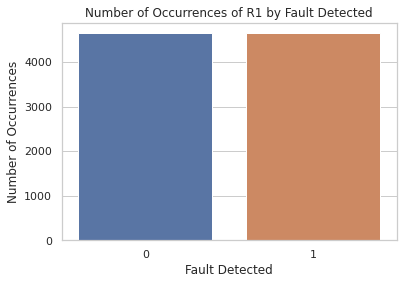

In [0]:
#Visualising using barplot
import seaborn as sns
import matplotlib.pyplot as plt

# Create a bar plot using the Seaborn library
sns.set(style="whitegrid")
ax = sns.barplot(x="fault_detected", y="R1", data=df)

# Set the plot title and axis labels
ax.set_title("Number of Occurrences of R1 by Fault Detected")
ax.set_xlabel("Fault Detected")
ax.set_ylabel("Number of Occurrences")

# Show the plot
plt.show()

In [0]:
#Checking for missing data in the dataset
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, sum
null_counts = FaultDF.agg(*[sum(col(c).isNull().cast("int")).alias(c) for c in FaultDF.columns])
print("Null counts:")
null_counts.show()

Null counts:
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
| R1| R2| R3| R4| R5| R6| R7| R8| R9|R10|R11|R12|R13|R14|R15|R16|R17|R18|R19|R20|fault_detected|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+
|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|             0|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+---+--------------+



In [0]:
#converting the features to a vector
from pyspark.ml.feature import RFormula
preprocess = RFormula(formula = "fault_detected ~ .")
FaultDF = preprocess.fit(FaultDF).transform(FaultDF)
FaultDF.show(5)

2023/04/28 07:07:39 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '4443fb3d7fef48fab1cd74a5e5c24eb1', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|       R1|       R2|       R3|       R4|       R5|       R6|       R7|       R8|       R9|      R10|      R11|      R12|      R13|      R14|      R15|      R16|      R17|      R18|      R19|      R20|fault_detected|            features|label|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+
|0.3

In [0]:
#splitting the data into training and test datasets
(trainingDF, testDF) = FaultDF.randomSplit([0.7,0.3], seed =100)

USING DECISION TREE ALGORITHM

In [0]:
#Importing the Decision Tree Classifier and fitting the model
from pyspark.ml.classification import DecisionTreeClassifier
dt = DecisionTreeClassifier(labelCol="label", featuresCol = "features")
model =dt.fit(trainingDF)

2023/04/28 07:07:40 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '8a88739a8c7841ada07eeb5240727a82', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:07:43 WARNING mlflow.pyspark.ml: Model inputs contain unsupported Spark data types: [StructField('features', VectorUDT(), True)]. Model signature is not logged.
2023/04/28 07:07:47 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 07:08:32 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/databricks/python/lib/python3.9/site-packages/_distutils_hack/__init__.py:30: UserWarning: Setuptools is replacing distutils."


In [0]:
#making the prediction
predictions =model.transform(testDF)
predictions.show()

+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|       R1|       R2|       R3|       R4|       R5|       R6|       R7|       R8|       R9|      R10|      R11|      R12|      R13|      R14|      R15|      R16|      R17|      R18|      R19|      R20|fault_detected|            features|label| rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+--------------+--------------------+----------+
|0.0253125| 0.039375|0.0528125| 0.056875|   0.0725| 0.041875|0.5109375|0.5628125|    0.605|   0.6025|0.6259375|      0.6|0.6090

In [0]:
#Checking for Decision tree accuracy
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions)

print("Accuracy =%g " %(accuracy))


Accuracy =0.952432 


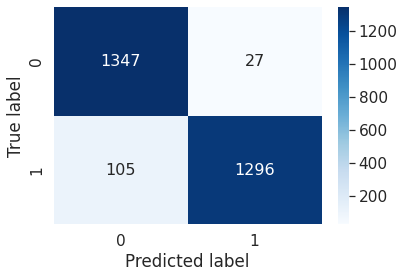

In [0]:
#Confusion Matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
# Convert the predicted labels and actual labels to numpy arrays
y_pred = predictions.select('prediction').rdd.map(lambda x: x[0]).collect()
y_true = predictions.select('label').rdd.map(lambda x: x[0]).collect()
# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred)
# Plot the confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

USING RANDOM FOREST CLASSIFEIR

In [0]:
#Using Random Forest Classifier 
#import the Classifier
from pyspark.ml.classification import RandomForestClassifier

# Initialize the Random Forest Classifier with default parameters
rf = RandomForestClassifier(labelCol="label", featuresCol="features")


In [0]:
# Fit the model to the training data
model2 = rf.fit(trainingDF)

# Use the model to make predictions on the test data
predictions2 = model2.transform(testDF)

2023/04/28 07:08:38 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '7e402311970646179135692aab91e889', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:08:47 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
#Checking for accuracy for Random Forest Classifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol = "prediction", metricName="accuracy")

accuracy = evaluator.evaluate(predictions2)

print("Accuracy =%g " %(accuracy))

Accuracy =0.967928 


USING LOGISTIC REGRESSION CLASSIFIER

In [0]:
# importing the logistic classifier
from pyspark.ml.classification import LogisticRegression

# Initializing the Logistic Regression Classifier with default parameters
lr = LogisticRegression(labelCol="label", featuresCol="features")

# Fitting the model to the training data and using the model to make prediction
model3 = lr.fit(trainingDF)

predictions3 = model3.transform(testDF)

2023/04/28 07:09:36 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '318c30141e6348ae8c823a632bdfa1f6', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:09:42 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
accuracy = evaluator.evaluate(predictions3)

print("Accuracy =%g " %(accuracy))

Accuracy =0.808649 


USING SVP ALGORITHM

In [0]:
# for support vector Machines
from pyspark.ml.classification import LinearSVC
svm = LinearSVC(labelCol="label", featuresCol="features")
# train the model
model4 = svm.fit(trainingDF)
predictions4 = model4.transform(testDF)

2023/04/28 07:10:29 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '594a56efae5e409482a1955995679655', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:10:47 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
accuracy = evaluator.evaluate(predictions4)
 
print("Accuracy =%g " %(accuracy))

Accuracy =0.805766 


HYPERPARAMETER TUNING Decision tree

In [0]:
from pyspark.ml.tuning import ParamGridBuilder
#  Create parameter grid
parameters=ParamGridBuilder()\
.addGrid(dt.impurity,['gini','entropy'])\
.addGrid(dt.maxDepth, [5,7,9])\
.addGrid(dt.maxBins, [32,64,128])\
.build()

In [0]:
from pyspark.ml.tuning import TrainValidationSplit
#Defining train validation Split
tvs = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(parameters)\
.setEstimator(dt)\
.setEvaluator(evaluator)

In [0]:
gridsearchModel =tvs.fit(trainingDF)

2023/04/28 07:11:34 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '8c84330c5f6b4c58914908cc04cdc012', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:12:24 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 07:13:19 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:

#Selecting the best model and identifying the parameters
bestModel =gridsearchModel.bestModel
print('Parameters for best Model: ')
print('MaxDepth Parameter: %g' %bestModel.getMaxDepth())
print('Impurity Parameter: %s' %bestModel.getImpurity())
print('MaxBins Parameter: %g' %bestModel.getMaxBins())


Parameters for best Model: 
MaxDepth Parameter: 7
Impurity Parameter: entropy
MaxBins Parameter: 128


In [0]:
import mlflow
logged_model = 'runs:/806a3480ab654e24b41ee5614fc13bbf/best_model'

# Load model
loaded_model = mlflow.spark.load_model(logged_model)

# Perform inference via model.transform()
loaded_predictions=loaded_model.transform(FaultDF)
loaded_predictions.show()


2023/04/28 07:14:07 INFO mlflow.spark: 'runs:/806a3480ab654e24b41ee5614fc13bbf/best_model' resolved as 'dbfs:/databricks/mlflow-tracking/1243323632912797/806a3480ab654e24b41ee5614fc13bbf/artifacts/best_model'
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+--------------+--------------------+-----+-------------+--------------------+----------+
|       R1|       R2|       R3|       R4|       R5|       R6|       R7|       R8|       R9|      R10|      R11|      R12|      R13|      R14|      R15|      R16|      R17|      R18|      R19|      R20|fault_detected|            features|label|rawPrediction|         probability|prediction|
+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+---------+----------

Hyperparameter tuning for Random Forest

In [0]:
from pyspark.ml.tuning import ParamGridBuilder
#  Create parameter grid
parameters=ParamGridBuilder()\
.addGrid(rf.impurity,['gini','entropy'])\
.addGrid(rf.maxDepth, [5,7,9])\
.addGrid(rf.maxBins, [32,64,128])\
.build()

In [0]:
from pyspark.ml.tuning import TrainValidationSplit
#Defining train validation Split
tvs_rf = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(parameters)\
.setEstimator(rf)\
.setEvaluator(evaluator)

In [0]:
gridsearchModel40 = tvs_rf.fit(trainingDF)

2023/04/28 07:14:14 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b11a4f984fa940efb0c0fb53124f9f63', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:15:26 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 07:16:26 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
#Selecting the best model and identifying the parameters
bestModel_rf =gridsearchModel40.bestModel
print('Parameters for best Model: ')
print('MaxDepth Parameter: %g' %bestModel_rf.getMaxDepth())
print('Impurity Parameter: %s' %bestModel_rf.getImpurity())
print('MaxBins Parameter: %g' %bestModel_rf.getMaxBins())

Parameters for best Model: 
MaxDepth Parameter: 9
Impurity Parameter: entropy
MaxBins Parameter: 128


In [0]:
New_accuracy_rf = evaluator.evaluate(bestModel_rf.transform(testDF))
 
print("New_Accuracy_rf =%g " %(New_accuracy_rf))



New_Accuracy_rf =0.972613 


Hyperparameter Tuning for Logistic Regression

In [0]:
#instantiating the grid parameters
param_grid_lr = (ParamGridBuilder()
             .addGrid(LogisticRegression.regParam, [0.01, 0.1])
             .addGrid(LogisticRegression.elasticNetParam, [0.0, 0.5])
              .addGrid(LogisticRegression.fitIntercept, [False, True])
             .build())

In [0]:
from pyspark.ml.tuning import TrainValidationSplit
#Defining TrainValidationSplit
tvs_lr = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(param_grid_lr)\
.setEstimator(lr)\
.setEvaluator(evaluator)

In [0]:
# train model using grid search
gridsearchModel23 = tvs_lr.fit(trainingDF)

2023/04/28 07:17:17 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '50ab643c06f7499698ef249078953718', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:17:37 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during pyspark.ml autologging: Tuning params should not include params not owned by the tuned estimator, but found a param undefined__regParam


In [0]:
bestModel_lr = gridsearchModel23.bestModel
print("Parameters for the Best Model:")
print("regParam Parameter: %g" % bestModel_lr.getOrDefault('regParam'))
print("fitIntercept Parameter: %s" % bestModel_lr.getOrDefault('fitIntercept'))
print("elasticNetParam Parameter: %g" % bestModel_lr.getOrDefault('elasticNetParam'))

Parameters for the Best Model:
regParam Parameter: 0
fitIntercept Parameter: True
elasticNetParam Parameter: 0


In [0]:
New_accuracy_lr = evaluator.evaluate(bestModel_lr.transform(testDF))
print("New_Accuracy_lr =%g " %(New_accuracy_lr))

New_Accuracy_lr =0.808649 


Hyperparameter tuning for SVP

In [0]:
#Instantiating the grid parameter
paramGrid_svm = ParamGridBuilder() \
    .addGrid(svm.regParam, [0.1, 0.01]) \
    .addGrid(svm.maxIter, [10, 100]) \
    .addGrid(svm.threshold, [0.0, 0.5]) \
    .build()

In [0]:
from pyspark.ml.tuning import TrainValidationSplit
#Defining TrainValidationSplit
tvs_svm = TrainValidationSplit()\
.setSeed(100)\
.setTrainRatio(0.75)\
.setEstimatorParamMaps(paramGrid_svm)\
.setEstimator(svm)\
.setEvaluator(evaluator)
# train model using grid search
gridsearchModel92 = tvs_svm.fit(trainingDF)

2023/04/28 07:17:38 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'f08d0a231bfb49a39f86c4a63f2116e4', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current pyspark.ml workflow
2023/04/28 07:19:01 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2023/04/28 07:19:54 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


In [0]:
# Get the best model
bestModel_svm = gridsearchModel92.bestModel
# Print the parameters of the best model
print("Parameters for the Best Model:")
print("RegParam Parameter: %g" % bestModel_svm.getOrDefault('regParam'))
print("MaxIter Parameter: %g" % bestModel_svm.getOrDefault('maxIter'))
print("Tol Parameter: %g" % bestModel_svm.getOrDefault('tol'))

Parameters for the Best Model:
RegParam Parameter: 0.1
MaxIter Parameter: 10
Tol Parameter: 1e-06


In [0]:
New_accuracy_svp = evaluator.evaluate(bestModel_svm.transform(testDF))
print("New_Accuracy_svp =%g " %(New_accuracy_svp))

New_Accuracy_svp =0.851171 
